# Preparations

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import tensorflow as tf

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

from utils.data_interface import Dataset, Data_Interface
from utils.evaluation import *
from utils.hemp_segmentation import *

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [3]:
class Config():
    dates = ['20190703', '20190719', '20190822']
    fields = ['Field_A', 'Field_C']
    seed = 1
    train_size = 0.8

In [4]:
Plant_Masks = {}
for date in Config.dates:
    for field in Config.fields:
        Plant_Masks[date + field] = gpd.read_file("../data/shapes/masks_{}/{}.shp".format(date, field)).to_crs({'init': 'epsg:32632', 'units' : 'm'})

Seed_Masks = {}
for c_value in range(1, 15):
        Seed_Masks["s_" + str(c_value)] = gpd.read_file("../data/shapes/C_{}.shp".format(c_value)).to_crs({'init': 'epsg:32632', 'units' : 'm'})
        
Fields = {
        'field_A' : gpd.read_file("../data/shapes/variante_A.shp").to_crs({'init': 'epsg:32632',
                                                                                    'units' : 'm'}),
        'field_B' : gpd.read_file("../data/shapes/variante_B.shp").to_crs({'init': 'epsg:32632',
                                                                                                     'units' : 'm'}),
        'field_C' : gpd.read_file("../data/shapes/variante_C.shp").to_crs({'init': 'epsg:32632',
                                                                                                     'units' : 'm'})
}

# Data Pipeline:

## Create Data Interfaces:

### Train Interface:
The Train Interface constists of 512x512px patches from Field C

In [5]:
d_0703_C = Dataset(name=Config.dates[0] + '_rgb_C',
            date=Config.dates[0],
            rgb_path='../data/rasters/' + Config.dates[0] + '/rgb.tif',
            ms_path='../data/rasters/' + Config.dates[0] + '/pc12.tif',
            mask_shapefile=Plant_Masks[Config.dates[0] + Config.fields[1]],
            outer_shapefile=Fields['field_C'],
            rgb_bands_to_read=[0, 1, 2],
            ms_bands_to_read=None,
            slice_shape=(512, 512))

d_0719_C = Dataset(name=Config.dates[1] + '_rgb_C', 
            date=Config.dates[1],
            rgb_path='../data/rasters/' + Config.dates[1] + '/rgb.tif',
            ms_path='../data/rasters/' + Config.dates[1] + '/pc12.tif',
            mask_shapefile=Plant_Masks[Config.dates[1] + Config.fields[1]],
            outer_shapefile=Fields['field_C'],
            rgb_bands_to_read=[0, 1, 2],
            ms_bands_to_read=None,
            grid=d_0703_C.grid.copy())

d_0822_C = Dataset(name=Config.dates[2] + '_rgb_C', 
            date=Config.dates[2],
            rgb_path='../data/rasters/' + Config.dates[2] + '/rgb.tif',
            ms_path='../data/rasters/' + Config.dates[2] + '/pc12.tif',
            mask_shapefile=Plant_Masks[Config.dates[2] + Config.fields[1]],
            outer_shapefile=Fields['field_C'],
            rgb_bands_to_read=[0, 1, 2],
            ms_bands_to_read=None,
            grid=d_0703_C.grid.copy())

di_train = Data_Interface([d_0703_C, d_0719_C, d_0822_C], {1001 : 1, 1005 : 2})

### Test Interface:
The Test Interface constists of 384x384px patches from Field A

In [6]:
d_0703_A = Dataset(name=Config.dates[0] + '_rgb_A', 
            date=Config.dates[0],
            rgb_path='../data/rasters/' + Config.dates[0] + '/rgb.tif',
            ms_path='../data/rasters/' + Config.dates[0] + '/pc12.tif',
            mask_shapefile=Plant_Masks[Config.dates[0] + Config.fields[0]],
            outer_shapefile=Fields['field_A'],
            rgb_bands_to_read=[0, 1, 2],
            ms_bands_to_read=None,
            slice_shape=(384, 384))

d_0719_A = Dataset(name=Config.dates[1] + '_rgb_A',  
            date=Config.dates[1],
            rgb_path='../data/rasters/' + Config.dates[1] + '/rgb.tif',
            ms_path='../data/rasters/' + Config.dates[1] + '/pc12.tif',
            mask_shapefile=Plant_Masks[Config.dates[1] + Config.fields[0]],
            outer_shapefile=Fields['field_A'],
            rgb_bands_to_read=[0, 1, 2],
            ms_bands_to_read=None,
            grid=d_0703_A.grid.copy(),
            slice_shape=(384, 384))

d_0822_A = Dataset(name=Config.dates[2] + '_rgb_A',  
            date=Config.dates[2],
            rgb_path='../data/rasters/' + Config.dates[2] + '/rgb.tif',
            ms_path='../data/rasters/' + Config.dates[2] + '/pc12.tif',
            mask_shapefile=Plant_Masks[Config.dates[2] + Config.fields[0]],
            outer_shapefile=Fields['field_A'],
            rgb_bands_to_read=[0, 1, 2],
            ms_bands_to_read=None,
            grid=d_0703_A.grid.copy(), slice_shape=(384, 384))

di_test_A = Data_Interface([d_0703_A, d_0719_A, d_0822_A], {1001 : 1, 1005 : 2})

### Save Patches into Folders:

In [7]:
if not os.path.exists('../data/sliced/train_c/'):
    di_train.save("train_c", skip_black_greater=0.95)

In [8]:
if not os.path.exists('../data/sliced/test_a/'):
    di_test_A.save("test_a")

## Prepare Data for Training:

### Split Train Data into Train and Validation Set:

In [9]:
from sklearn.model_selection import train_test_split

train_file_path = '../data/sliced/train_c/'
train_file_list = os.listdir(train_file_path + 'images')
train_file_list = [s[9::] for s in train_file_list]
train_file_list = list(set(train_file_list))

train_files, val_files = train_test_split(train_file_list, 
                                    train_size=Config.train_size, 
                                    random_state=Config.seed, 
                                    shuffle=True)

train_list = []
for e in train_files:
    train_list.append(Config.dates[0] + "_" + e)
    train_list.append(Config.dates[1] + "_" + e)
    train_list.append(Config.dates[2] + "_" + e)
    
val_list = []
for e in val_files:
    val_list.append(Config.dates[0] + "_" + e)
    val_list.append(Config.dates[1] + "_" + e)
    val_list.append(Config.dates[2] + "_" + e)

train_list_images = [train_file_path + 'images/' + f for f in train_list]
train_list_masks = [train_file_path + 'masks/' + f for f in train_list]

val_list_images = [train_file_path + 'images/' + f for f in val_list]
val_list_masks = [train_file_path + 'masks/' + f for f in val_list]

test_file_path = '../data/sliced/test_a/'
test_file_list = os.listdir(test_file_path + 'images')

test_list_images = [test_file_path + 'images/' + f for f in test_file_list]
test_list_masks = [test_file_path + 'masks/' + f for f in test_file_list]

### Create Tensorflow Datasets for Training, Validation and Testing:
https://www.tensorflow.org/api_docs/python/tf/data/Dataset


In [10]:
BATCH_SIZE = 8
train_set, val_set, test_set = create_train_datasets((train_list_images, train_list_masks), (val_list_images, val_list_masks), (test_list_images, test_list_masks), 
                                              buffer_size=512, batch_size=BATCH_SIZE)

### Show random Samples from train set:

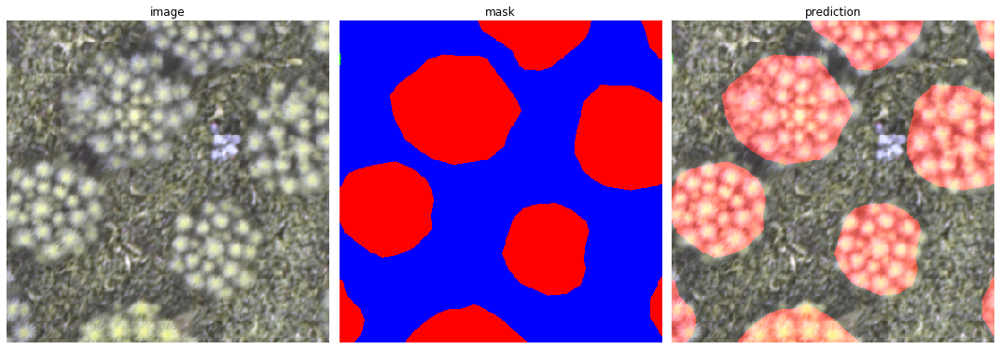

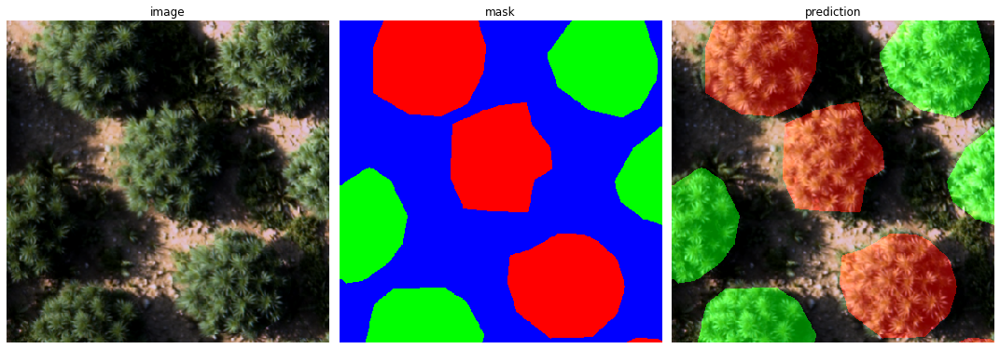

In [11]:
show(train_set, rows=2)

### Show random Samples from validation set:

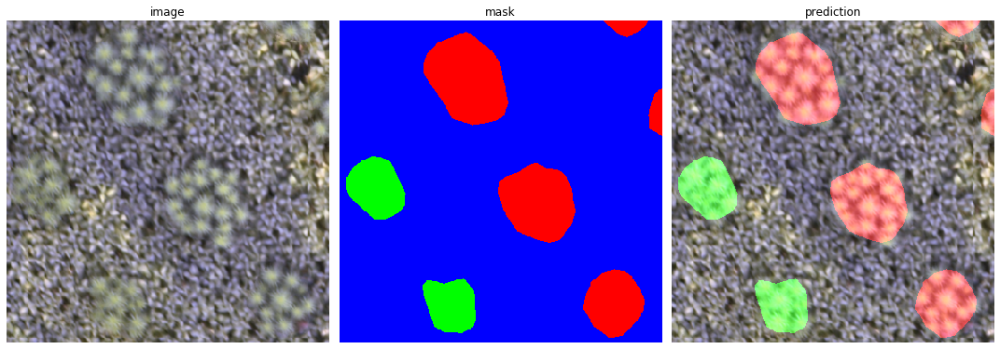

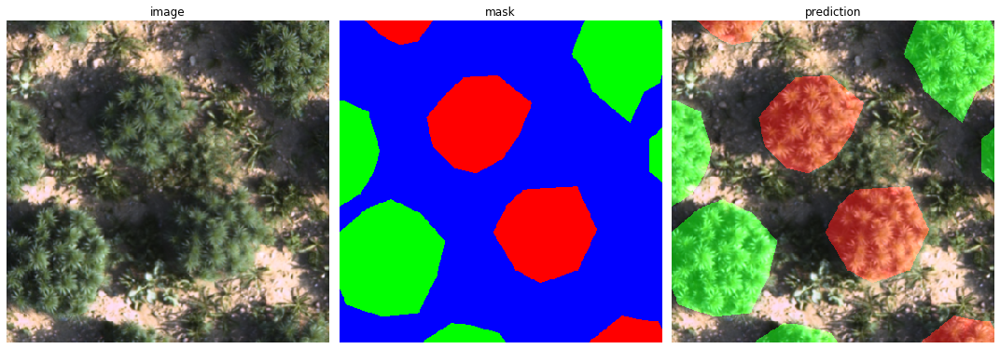

In [12]:
show(val_set, rows=2)

# Model Training

## Create Model with tensorflow.keras:
https://www.tensorflow.org/api_docs/python/tf/keras/  
U-Net based Model with pretrained ResNet-50 Backend  
https://www.tensorflow.org/api_docs/python/tf/keras/applications/ResNet50

In [20]:
BACKBONE_NAME = 'resnet50'
model = segmentation_model_func(3, BACKBONE_NAME, True)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 384, 384, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 390, 390, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 192, 192, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 192, 192, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

In [21]:
model.compile(optimizer=tf.keras.optimizers.Adam(), loss=dice_cce, metrics=[my_dice_metric_hemp, my_dice_metric_all])

## Show Sample Prediction with untrained Model:

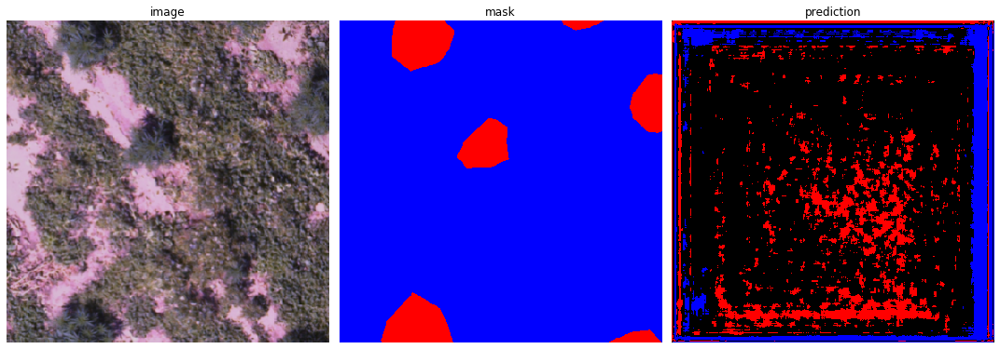

In [23]:
show(val_set, model, 1)

## Define tensorflow.keras training Callbacks
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks

In [17]:
lr_schedule = StepDecay(initAlpha=0.0002, factor=0.3, dropEvery=20)
model_checkpoint = tf.keras.callbacks.ModelCheckpoint('../notebooks/models/best_' + BACKBONE_NAME + '.h5',monitor='val_my_dice_metric_hemp', 
                                   mode = 'max', save_best_only=True, verbose=1)

In [ ]:
EPOCHS = 100

model_history = model.fit(train_set.map(unindex).shuffle(512, reshuffle_each_iteration=True).repeat(), epochs=EPOCHS,
                          steps_per_epoch=(len(train_list)//BATCH_SIZE),
                          validation_steps=None,
                          validation_data=val_set.map(unindex),
                          callbacks=[tf.keras.callbacks.LearningRateScheduler(lr_schedule), model_checkpoint])

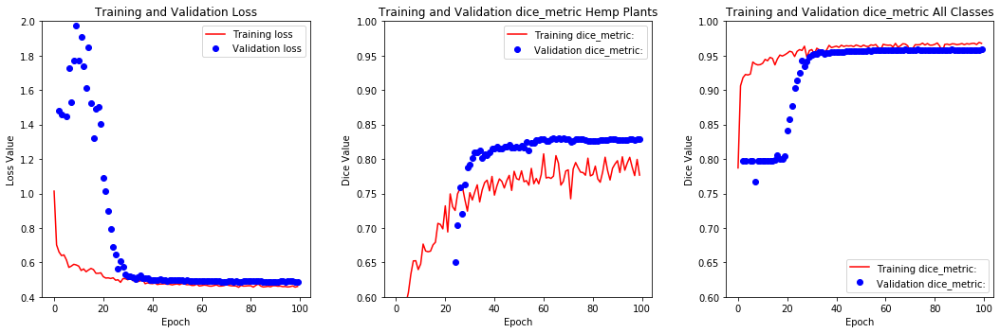

In [28]:
epochs = range(EPOCHS)
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

ax[0].plot(epochs, model_history.history['loss'], 'r', label='Training loss')
ax[0].plot(epochs, model_history.history['val_loss'], 'bo', label='Validation loss')
ax[0].set_title('Training and Validation Loss')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss Value')
ax[0].set_ylim([0.4, 2.])
ax[0].legend()
ax[1].plot(epochs, model_history.history['my_dice_metric_hemp'], 'r', label='Training dice_metric:')
ax[1].plot(epochs, model_history.history['val_my_dice_metric_hemp'], 'bo', label='Validation dice_metric:')
ax[1].set_title('Training and Validation dice_metric Hemp Plants')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Dice Value')
ax[1].set_ylim([0.6, 1.])
ax[1].legend()
ax[2].plot(epochs, model_history.history['my_dice_metric_all'], 'r', label='Training dice_metric:')
ax[2].plot(epochs, model_history.history['val_my_dice_metric_all'], 'bo', label='Validation dice_metric:')
ax[2].set_title('Training and Validation dice_metric All Classes')
ax[2].set_xlabel('Epoch')
ax[2].set_ylabel('Dice Value')
ax[2].set_ylim([0.6, 1.])
ax[2].legend()

plt.tight_layout()

## Load pretrained Model

In [11]:
model = tf.keras.models.load_model('../notebooks/models/best_resnet50.h5', custom_objects={'dice_cce': dice_cce, 'my_dice_metric_hemp': my_dice_metric_hemp, 'my_dice_metric_all': my_dice_metric_all})

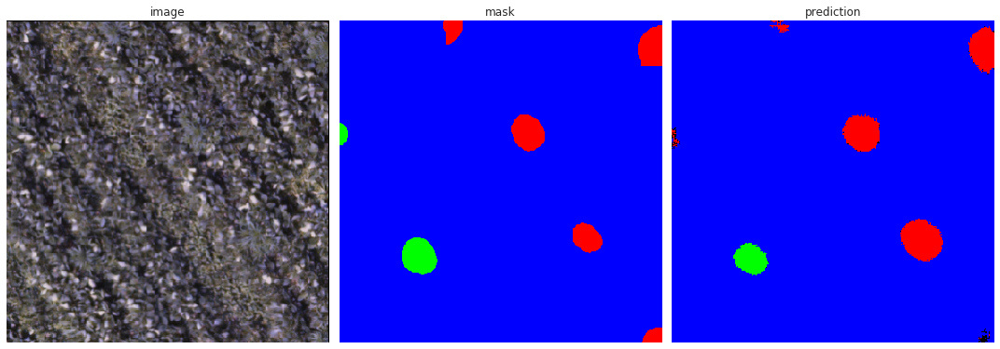

In [23]:
show(test_set, model, 1)

# Calculate optimal prediction threshold:
In order to create Binary Prediction Maps to measure accuracy a threshold to the class probability maps has to applied. The optimal threshold to apply can be can be empirically calculated by looping over the validation set and calculate accuracy on different threshold levels

In [12]:
sev = Segmentation_Evaluation(model)

In [13]:
preds_all = []
msks_all = []

for batch in val_set:
    images, masks = batch[0].numpy(), batch[1].numpy()
    predictions = model.predict(images)
    for msk, pred in zip(masks, predictions):
        msks_all.append(msk.astype('float32'))
        preds_all.append(pred.astype('float32'))
        
msks_all = np.asarray(msks_all)
preds_all = np.asarray(preds_all)

In [14]:
def dice_metric_batch(y_true_in, y_pred_in):
    y_true_in = y_true_in[:, :, :, 0:2].copy()
    y_pred_in = y_pred_in[:, :, :, 0:2].copy()
    batch_size = y_true_in.shape[0]
    metric = []
    for batch in range(batch_size):
        value = sev.dice_score(y_true_in[batch], y_pred_in[batch])
        metric.append(value)
    return np.nanmean(metric)

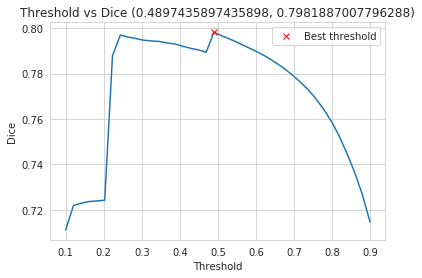

In [15]:
## Scoring for different thresholds, choose threshold by validation data 
thresholds_ori = np.linspace(0.1, 0.9, 40)
dices = np.array([dice_metric_batch(msks_all, preds_all > threshold) for threshold in thresholds_ori])

threshold_best_index = np.argmax(dices) 
dice_best = dices[threshold_best_index]
BEST_THRESHOLD = thresholds_ori[threshold_best_index]

sns.set_style("whitegrid")
plt.plot(thresholds_ori, dices)
plt.plot(BEST_THRESHOLD, dice_best, "xr", label="Best threshold")
plt.xlabel("Threshold")
plt.ylabel("Dice")
plt.title("Threshold vs Dice ({}, {})".format(BEST_THRESHOLD, dice_best))
plt.legend()

## Calculate Error Map

In [19]:
errors_1001 = np.zeros((384, 384))
errors_1005 = np.zeros((384, 384))

for batch in test_set:
    images, masks = batch[0].numpy(), batch[1].numpy()
    predictions = model.predict(images) > BEST_THRESHOLD
    for msk, pred in zip(masks, predictions):
        errors_1001 += (msk[:, :, 0] != pred[:, :, 0]).astype(float)
        errors_1005 += (msk[:, :, 1] != pred[:, :, 1]).astype(float)

errors_1001 /= errors_1001.max()
errors_1005 /= errors_1005.max()

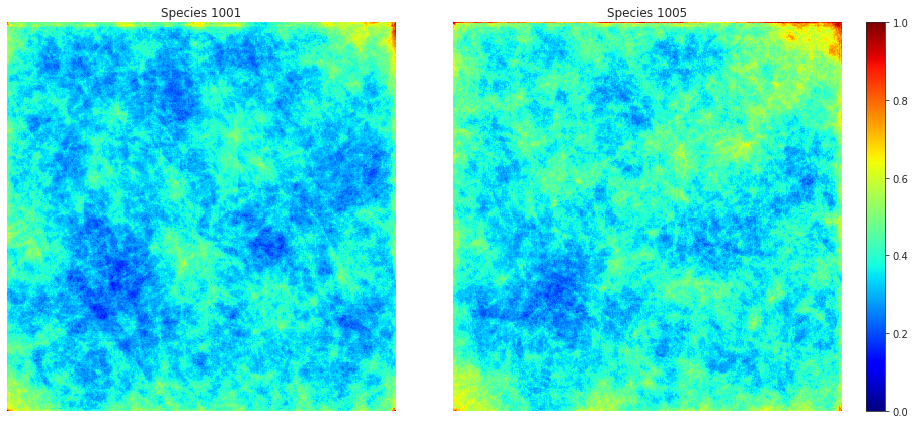

In [20]:
sns.set_style("white")
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.imshow(errors_1001, vmin=0.0, vmax=1.0, cmap='jet')
plt.axis('off')
plt.title("Species 1001")
plt.subplot(1, 2, 2)
plt.imshow(errors_1005, vmin=0.0, vmax=1.0, cmap='jet')
plt.title("Species 1005")
plt.axis('off')
plt.colorbar()
plt.tight_layout()

# Create Prediction Maps

In [19]:
sev = Segmentation_Evaluation(model, BEST_THRESHOLD)

In [33]:
date = {"03.07": 0, "19.07": 1, "22.08": 2}

## Field A (Testing)

### Date 03.07.2019

In [ ]:
sev.create_prediction_map(di_test_A, date["03.07"], apply_majority_vote=False, overlap=0)
sev.create_prediction_map(di_test_A, date["03.07"], apply_majority_vote=True, overlap=0)
sev.create_prediction_map(di_test_A, date["03.07"], apply_majority_vote=True, overlap=64)

### Date 19.07.2019

In [ ]:
sev.create_prediction_map(di_test_A, date["19.07"], apply_majority_vote=False, overlap=0)
sev.create_prediction_map(di_test_A, date["19.07"], apply_majority_vote=True, overlap=0)
sev.create_prediction_map(di_test_A, date["19.07"], apply_majority_vote=True, overlap=64)

### Date 22.08.2019

In [ ]:
sev.create_prediction_map(di_test_A, date["22.08"], apply_majority_vote=False, overlap=0)
sev.create_prediction_map(di_test_A, date["22.08"], apply_majority_vote=True, overlap=0)
sev.create_prediction_map(di_test_A, date["22.08"], apply_majority_vote=True, overlap=64)

 ## Field B (Testing)

### Date 03.07.2019

In [ ]:
sev.create_prediction_map(di_test_B, date["03.07"], apply_majority_vote=False, overlap=0)
sev.create_prediction_map(di_test_B, date["03.07"], apply_majority_vote=True, overlap=0)
sev.create_prediction_map(di_test_B, date["03.07"], apply_majority_vote=True, overlap=64)

### Date 19.07.2019

In [ ]:
sev.create_prediction_map(di_test_B, date["19.07"], apply_majority_vote=False, overlap=0)
sev.create_prediction_map(di_test_B, date["19.07"], apply_majority_vote=True, overlap=0)
sev.create_prediction_map(di_test_B, date["19.07"], apply_majority_vote=True, overlap=64)

### Date 22.08.2019

In [ ]:
sev.create_prediction_map(di_test_B, date["22.08"], apply_majority_vote=False, overlap=0)
sev.create_prediction_map(di_test_B, date["22.08"], apply_majority_vote=True, overlap=0)
sev.create_prediction_map(di_test_B, date["22.08"], apply_majority_vote=True, overlap=64)

## Field C (Training)

### Date 03.07.2019

In [ ]:
sev.create_prediction_map(di_train_C, date["03.07"], apply_majority_vote=False, overlap=0)
sev.create_prediction_map(di_train_C, date["03.07"], apply_majority_vote=True, overlap=0)
sev.create_prediction_map(di_train_C, date["03.07"], apply_majority_vote=True, overlap=64)

### Date 19.07.2019

In [ ]:
sev.create_prediction_map(di_train_C, date["19.07"], apply_majority_vote=False, overlap=0)
sev.create_prediction_map(di_train_C, date["19.07"], apply_majority_vote=True, overlap=0)
sev.create_prediction_map(di_train_C, date["19.07"], apply_majority_vote=True, overlap=64)

### Date 22.08.2019

In [ ]:
sev.create_prediction_map(di_train_C, date["22.08"], apply_majority_vote=False, overlap=0)
sev.create_prediction_map(di_train_C, date["22.08"], apply_majority_vote=True, overlap=0)
sev.create_prediction_map(di_train_C, date["22.08"], apply_majority_vote=True, overlap=64)

# Display Results

In [17]:
grid = gpd.read_file('../data/exports/results_grid.shp')
rgb_map_0703 = rio.open("../data/rasters/20190703/rgb.tif")
rgb_map_0719 = rio.open("../data/rasters/20190703/rgb.tif")
rgb_map_0822 = rio.open("../data/rasters/20190703/rgb.tif")

## Field A (Testing)

## No Postprocessing

### Date 03.07.2019

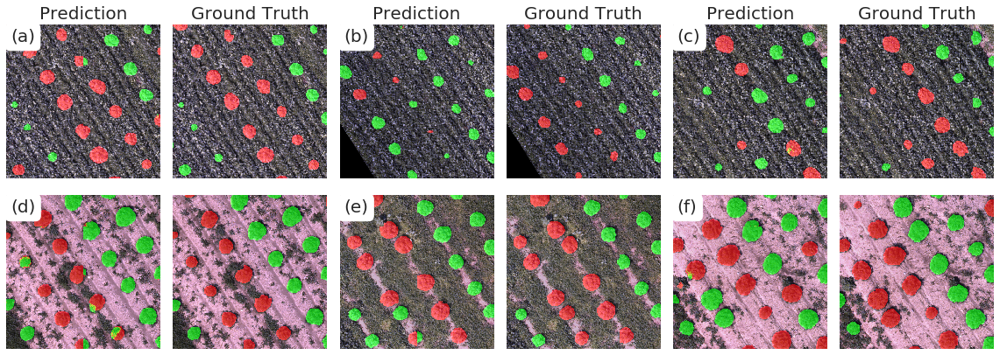

In [18]:
rgb_map = rio.open("../data/rasters/20190703/rgb.tif")
prediction_map = rio.open("../data/exports/prediction_20190703_rgb_A_mv_False_overlap_0.tif")
gt_shapefile = Plant_Masks['20190703Field_A']
display_results(rgb_map, prediction_map, grid.iloc[::-1], gt_shapefile)

### Date 19.07.2019

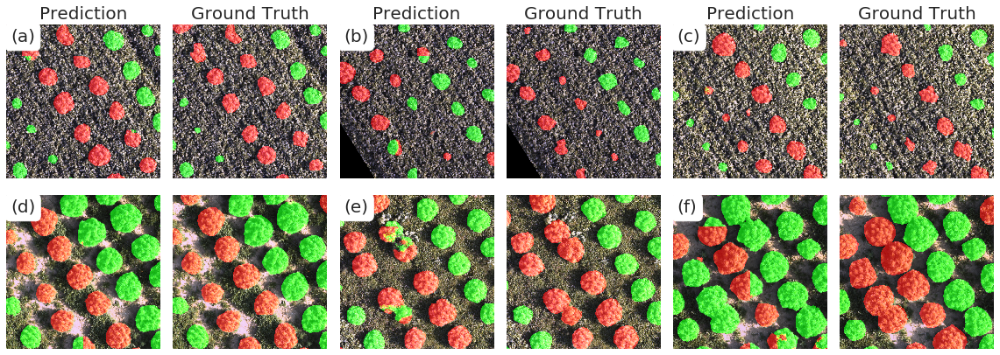

In [27]:
rgb_map = rio.open("../data/rasters/20190719/rgb.tif")
prediction_map = rio.open("../data/exports/prediction_20190719_rgb_A_mv_False_overlap_0.tif")
gt_shapefile = Plant_Masks['20190719Field_A']
display_results(rgb_map, prediction_map, grid.iloc[::-1], gt_shapefile)

### Date 22.08.2019

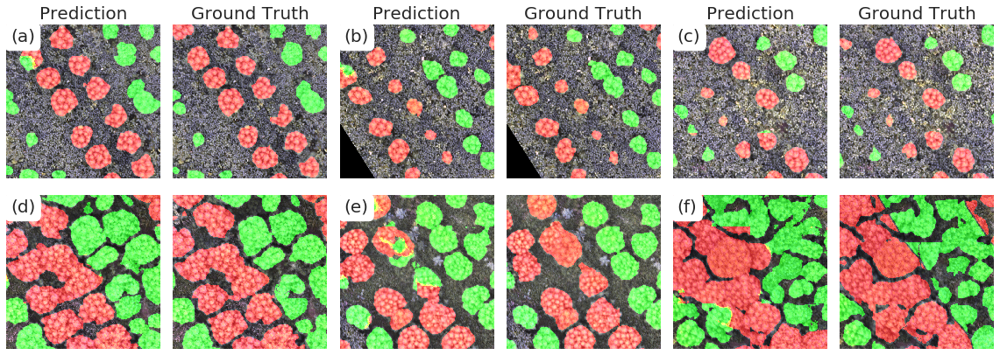

In [28]:
rgb_map = rio.open("../data/rasters/20190822/rgb.tif")
prediction_map = rio.open("../data/exports/prediction_20190822_rgb_A_mv_False_overlap_0.tif")
gt_shapefile = Plant_Masks['20190822Field_A']
display_results(rgb_map, prediction_map, grid.iloc[::-1], gt_shapefile)

## Majority Voting

### Date 03.07.2019

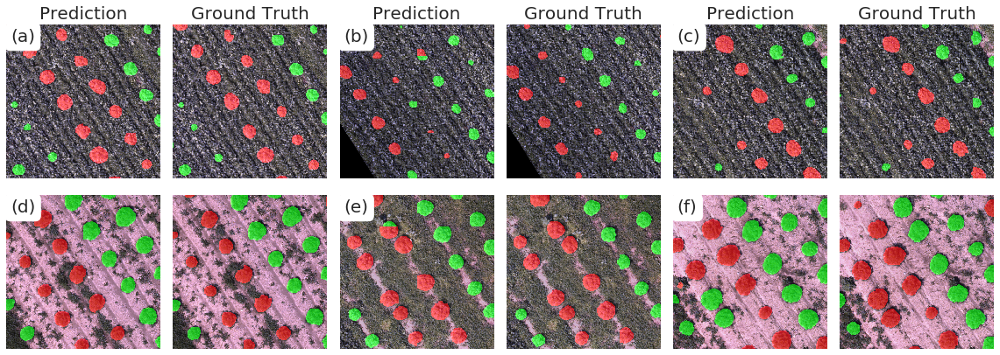

In [29]:
rgb_map = rio.open("../data/rasters/20190703/rgb.tif")
prediction_map = rio.open("../data/exports/prediction_20190703_rgb_A_mv_True_overlap_0.tif")
gt_shapefile = Plant_Masks['20190703Field_A']
display_results(rgb_map, prediction_map, grid.iloc[::-1], gt_shapefile)

### Date 19.07.2019

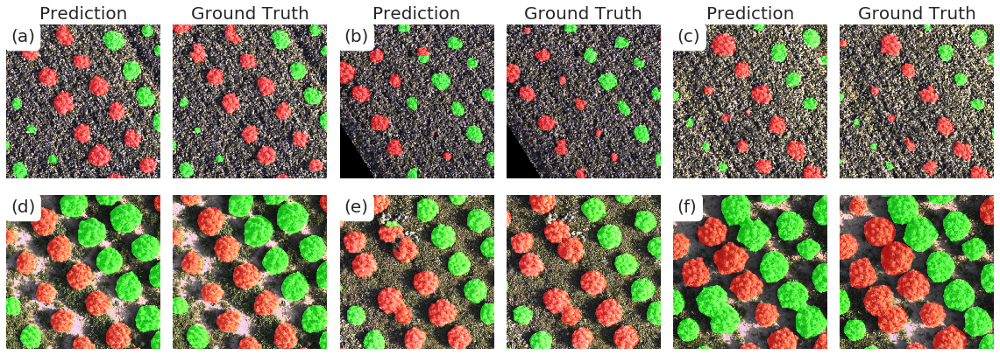

In [30]:
rgb_map = rio.open("../data/rasters/20190719/rgb.tif")
prediction_map = rio.open("../data/exports/prediction_20190719_rgb_A_mv_True_overlap_0.tif")
gt_shapefile = Plant_Masks['20190719Field_A']
display_results(rgb_map, prediction_map, grid.iloc[::-1], gt_shapefile)

### Date 22.08.2019

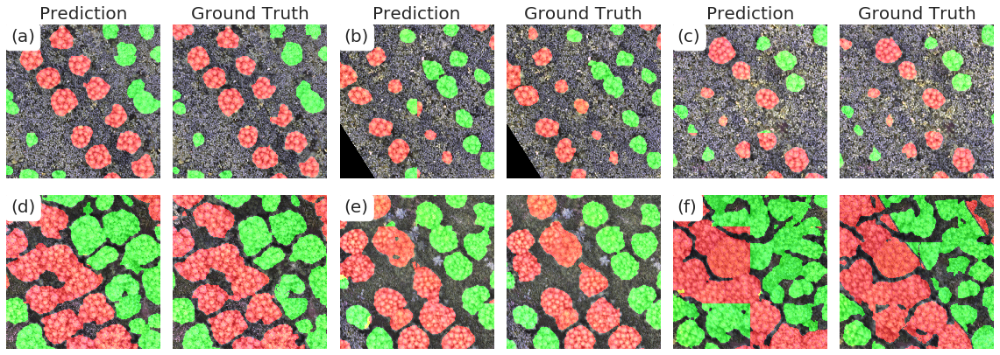

In [31]:
rgb_map = rio.open("../data/rasters/20190822/rgb.tif")
prediction_map = rio.open("../data/exports/prediction_20190822_rgb_A_mv_True_overlap_0.tif")
gt_shapefile = Plant_Masks['20190822Field_A']
display_results(rgb_map, prediction_map, grid.iloc[::-1], gt_shapefile)

## Majority Voting + Center Crop

### Date 03.07.2019

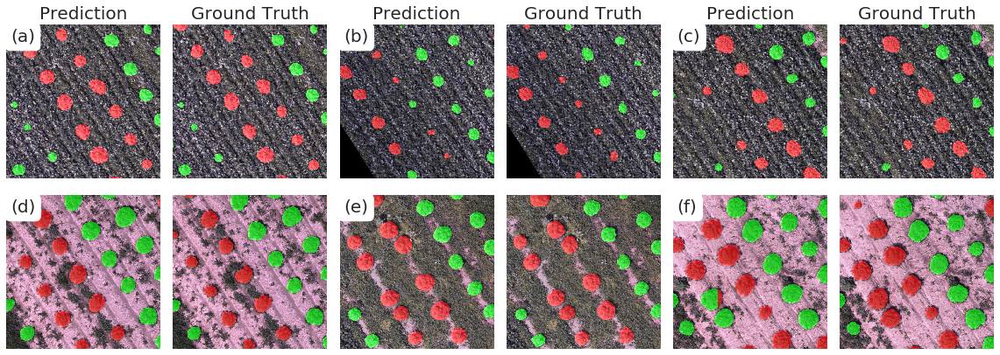

In [32]:
rgb_map = rio.open("../data/rasters/20190703/rgb.tif")
prediction_map = rio.open("../data/exports/prediction_20190703_rgb_A_mv_True_overlap_64.tif")
gt_shapefile = Plant_Masks['20190703Field_A']
display_results(rgb_map, prediction_map, grid.iloc[::-1], gt_shapefile)

### Date 19.07.2019

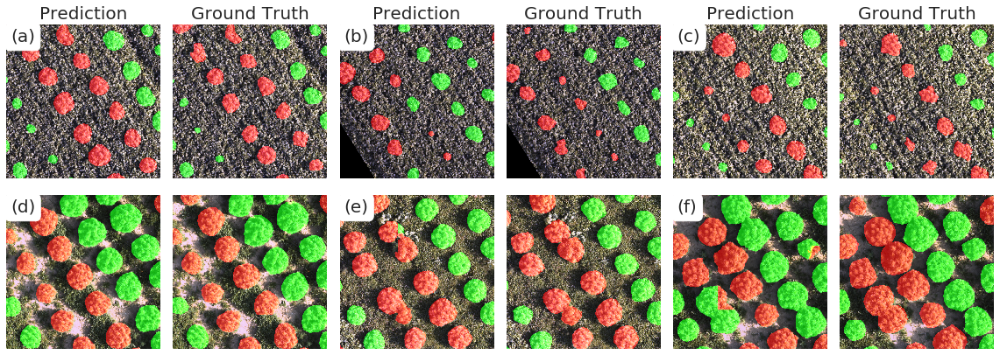

In [33]:
rgb_map = rio.open("../data/rasters/20190719/rgb.tif")
prediction_map = rio.open("../data/exports/prediction_20190719_rgb_A_mv_True_overlap_64.tif")
gt_shapefile = Plant_Masks['20190719Field_A']
display_results(rgb_map, prediction_map, grid.iloc[::-1], gt_shapefile)

### Date 22.08.2019

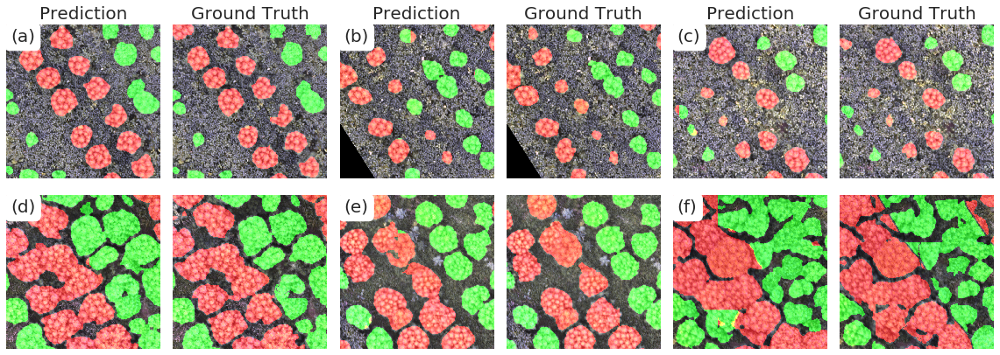

In [34]:
rgb_map = rio.open("../data/rasters/20190822/rgb.tif")
prediction_map = rio.open("../data/exports/prediction_20190822_rgb_A_mv_True_overlap_64.tif")
gt_shapefile = Plant_Masks['20190822Field_A']
display_results(rgb_map, prediction_map, grid.iloc[::-1], gt_shapefile)

# Calculate Dice Coefficients on prediction maps:

## No Postprocessing

In [74]:
results_no = {}

In [75]:
prediction_rasters = [rio.open("../data/exports/prediction_20190703_rgb_A_mv_False_overlap_0.tif"),
                      rio.open("../data/exports/prediction_20190719_rgb_A_mv_False_overlap_0.tif"),
                      rio.open("../data/exports/prediction_20190822_rgb_A_mv_False_overlap_0.tif")]

ground_truth_shapes = [Plant_Masks['20190703Field_A'],
                      Plant_Masks['20190719Field_A'],
                      Plant_Masks['20190822Field_A']]

results_no['0703_A'], results_no['0719_A'], results_no['0822_A'] = sev.evaluate_on_map(prediction_rasters, ground_truth_shapes)

In [76]:
prediction_rasters = [rio.open("../data/exports/prediction_20190703_rgb_C_mv_False_overlap_0.tif"),
                      rio.open("../data/exports/prediction_20190719_rgb_C_mv_False_overlap_0.tif"),
                      rio.open("../data/exports/prediction_20190822_rgb_C_mv_False_overlap_0.tif")]

ground_truth_shapes = [Plant_Masks['20190703Field_C'],
                      Plant_Masks['20190719Field_C'],
                      Plant_Masks['20190822Field_C']]

results_no['0703_C'], results_no['0719_C'], results_no['0822_C'] = sev.evaluate_on_map(prediction_rasters, ground_truth_shapes)

In [77]:
print_results(results_no, results_no)

+------------+-----------------+------------------+-----------+-------------------+
|    Date    | Dice Validation | Diff to Val Base | Dice Test | Diff to Test Base |
+------------+-----------------+------------------+-----------+-------------------+
| 03.07.2019 |      89.44      |       0.00       |   81.46   |        0.00       |
| 19.07.2019 |      93.29      |       0.00       |   80.82   |        0.00       |
| 22.08.2019 |      92.13      |       0.00       |   87.22   |        0.00       |
+------------+-----------------+------------------+-----------+-------------------+


## Majority Voting

In [86]:
results_majority = {}

In [87]:
prediction_rasters = [rio.open("../data/exports/prediction_20190703_rgb_A_mv_True_overlap_0.tif"),
                      rio.open("../data/exports/prediction_20190719_rgb_A_mv_True_overlap_0.tif"),
                      rio.open("../data/exports/prediction_20190822_rgb_A_mv_True_overlap_0.tif")]

ground_truth_shapes = [Plant_Masks['20190703Field_A'],
                      Plant_Masks['20190719Field_A'],
                      Plant_Masks['20190822Field_A']]

results_majority['0703_A'], results_majority['0719_A'], results_majority['0822_A'] = sev.evaluate_on_map(prediction_rasters, ground_truth_shapes)

In [88]:
prediction_rasters = [rio.open("../data/exports/prediction_20190703_rgb_C_mv_True_overlap_0.tif"),
                      rio.open("../data/exports/prediction_20190719_rgb_C_mv_True_overlap_0.tif"),
                      rio.open("../data/exports/prediction_20190822_rgb_C_mv_True_overlap_0.tif")]

ground_truth_shapes = [Plant_Masks['20190703Field_C'],
                      Plant_Masks['20190719Field_C'],
                      Plant_Masks['20190822Field_C']]

results_majority['0703_C'], results_majority['0719_C'], results_majority['0822_C'] = sev.evaluate_on_map(prediction_rasters, ground_truth_shapes)

In [89]:
print_results(results_majority, results_no)

+------------+-----------------+------------------+-----------+-------------------+
|    Date    | Dice Validation | Diff to Val Base | Dice Test | Diff to Test Base |
+------------+-----------------+------------------+-----------+-------------------+
| 03.07.2019 |      93.92      |       4.48       |   86.77   |        5.31       |
| 19.07.2019 |      95.05      |       1.76       |   85.25   |        4.42       |
| 22.08.2019 |      92.93      |       0.80       |   88.39   |        1.17       |
+------------+-----------------+------------------+-----------+-------------------+


## Majority Voting + Center Crop

In [90]:
results_center = {}

In [91]:
prediction_rasters = [rio.open("../data/exports/prediction_20190703_rgb_A_mv_True_overlap_64.tif"),
                      rio.open("../data/exports/prediction_20190719_rgb_A_mv_True_overlap_64.tif"),
                      rio.open("../data/exports/prediction_20190822_rgb_A_mv_True_overlap_64.tif")]

ground_truth_shapes = [Plant_Masks['20190703Field_A'],
                      Plant_Masks['20190719Field_A'],
                      Plant_Masks['20190822Field_A']]

results_center['0703_A'], results_center['0719_A'], results_center['0822_A'] = sev.evaluate_on_map(prediction_rasters, ground_truth_shapes)

In [92]:
prediction_rasters = [rio.open("../data/exports/prediction_20190703_rgb_C_mv_True_overlap_64.tif"),
                      rio.open("../data/exports/prediction_20190719_rgb_C_mv_True_overlap_64.tif"),
                      rio.open("../data/exports/prediction_20190822_rgb_C_mv_True_overlap_64.tif")]

ground_truth_shapes = [Plant_Masks['20190703Field_C'],
                      Plant_Masks['20190719Field_C'],
                      Plant_Masks['20190822Field_C']]

results_center['0703_C'], results_center['0719_C'], results_center['0822_C'] = sev.evaluate_on_map(prediction_rasters, ground_truth_shapes)

In [93]:
print_results(results_center, results_majority)

+------------+-----------------+------------------+-----------+-------------------+
|    Date    | Dice Validation | Diff to Val Base | Dice Test | Diff to Test Base |
+------------+-----------------+------------------+-----------+-------------------+
| 03.07.2019 |      94.79      |       0.87       |   88.37   |        1.60       |
| 19.07.2019 |      95.77      |       0.71       |   86.65   |        1.40       |
| 22.08.2019 |      93.76      |       0.83       |   89.38   |        0.99       |
+------------+-----------------+------------------+-----------+-------------------+


# Plants Counting

Take only prediction maps with highest accuracy (majority voting + center crop)

In [16]:
prediction_0703_A = rio.open("../data/exports/prediction_20190703_rgb_A_mv_True_overlap_64.tif")
prediction_0719_A = rio.open("../data/exports/prediction_20190719_rgb_A_mv_True_overlap_64.tif")
prediction_0703_C = rio.open("../data/exports/prediction_20190703_rgb_C_mv_True_overlap_64.tif")
prediction_0719_C = rio.open("../data/exports/prediction_20190719_rgb_C_mv_True_overlap_64.tif")

In [21]:
df_prediction_0703_A = vectorize_prediction_map(prediction_0703_A)
df_prediction_0719_A = vectorize_prediction_map(prediction_0719_A)
df_prediction_0703_C = vectorize_prediction_map(prediction_0703_C)
df_prediction_0719_C = vectorize_prediction_map(prediction_0719_C)

## Field A

### Date 03.07.2019

#### Species 1001

In [20]:
calculate_iou(df_prediction_0703_A[df_prediction_0703_A['Species'] == 1001], 
              Plant_Masks['20190703Field_A'][Plant_Masks['20190703Field_A']['Species'] == 1001])

+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
| All Plants GT | All Plants Pred | True Positives | False Positves | False Negatives | Precision | Recall |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
|      569      |       568       |      490       |       78       |        79       |   86.27   | 86.12  |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+


#### Species 1005

In [22]:
calculate_iou(df_prediction_0703_A[df_prediction_0703_A['Species'] == 1005], 
              Plant_Masks['20190703Field_A'][Plant_Masks['20190703Field_A']['Species'] == 1005])

+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
| All Plants GT | All Plants Pred | True Positives | False Positves | False Negatives | Precision | Recall |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
|      579      |       595       |      491       |      104       |        88       |   82.52   | 84.80  |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+


#### Species independent

In [30]:
calculate_iou(df_prediction_0703_A, Plant_Masks['20190703Field_A'])

+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
| All Plants GT | All Plants Pred | True Positives | False Positves | False Negatives | Precision | Recall |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
|      1148     |       1163      |      1066      |       97       |        82       |   91.66   | 92.86  |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+


### Date 19.07.2019

#### Species 1001

In [31]:
calculate_iou(df_prediction_0719_A[df_prediction_0719_A['Species'] == 1001], 
              Plant_Masks['20190719Field_A'][Plant_Masks['20190719Field_A']['Species'] == 1001])

+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
| All Plants GT | All Plants Pred | True Positives | False Positves | False Negatives | Precision | Recall |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
|      575      |       596       |      486       |      110       |        89       |   81.54   | 84.52  |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+


#### Species 1005

In [32]:
calculate_iou(df_prediction_0719_A[df_prediction_0719_A['Species'] == 1005], 
              Plant_Masks['20190719Field_A'][Plant_Masks['20190719Field_A']['Species'] == 1005])

+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
| All Plants GT | All Plants Pred | True Positives | False Positves | False Negatives | Precision | Recall |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
|      590      |       607       |      502       |      105       |        88       |   82.70   | 85.08  |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+


#### Species independent

In [33]:
calculate_iou(df_prediction_0719_A, Plant_Masks['20190719Field_A'])

+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
| All Plants GT | All Plants Pred | True Positives | False Positves | False Negatives | Precision | Recall |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
|      1165     |       1203      |      1074      |      129       |        91       |   89.28   | 92.19  |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+


## Field C

### Date 03.07.2019

#### Species 1001

In [23]:
calculate_iou(df_prediction_0703_C[df_prediction_0703_C['Species'] == 1001], 
              Plant_Masks['20190703Field_C'][Plant_Masks['20190703Field_C']['Species'] == 1001])

+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
| All Plants GT | All Plants Pred | True Positives | False Positves | False Negatives | Precision | Recall |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
|      485      |       500       |      466       |       34       |        19       |   93.20   | 96.08  |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+


#### Species 1005

In [24]:
calculate_iou(df_prediction_0703_C[df_prediction_0703_C['Species'] == 1005], 
              Plant_Masks['20190703Field_C'][Plant_Masks['20190703Field_C']['Species'] == 1005])

+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
| All Plants GT | All Plants Pred | True Positives | False Positves | False Negatives | Precision | Recall |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
|      481      |       495       |      456       |       39       |        25       |   92.12   | 94.80  |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+


#### Species independent

In [28]:
calculate_iou(df_prediction_0703_C, Plant_Masks['20190703Field_C'])

+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
| All Plants GT | All Plants Pred | True Positives | False Positves | False Negatives | Precision | Recall |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
|      966      |       995       |      929       |       66       |        37       |   93.37   | 96.17  |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+


### Date 19.07.2019

#### Species 1001

In [25]:
calculate_iou(df_prediction_0719_C[df_prediction_0719_C['Species'] == 1001], 
              Plant_Masks['20190719Field_C'][Plant_Masks['20190719Field_C']['Species'] == 1001])

+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
| All Plants GT | All Plants Pred | True Positives | False Positves | False Negatives | Precision | Recall |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
|      516      |       552       |      491       |       61       |        25       |   88.95   | 95.16  |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+


#### Species 1005

In [26]:
calculate_iou(df_prediction_0719_C[df_prediction_0719_C['Species'] == 1005], 
              Plant_Masks['20190719Field_C'][Plant_Masks['20190719Field_C']['Species'] == 1005])

+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
| All Plants GT | All Plants Pred | True Positives | False Positves | False Negatives | Precision | Recall |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
|      505      |       538       |      477       |       61       |        28       |   88.66   | 94.46  |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+


#### Species independent

In [29]:
calculate_iou(df_prediction_0719_C, Plant_Masks['20190719Field_C'])

+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
| All Plants GT | All Plants Pred | True Positives | False Positves | False Negatives | Precision | Recall |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+
|      1021     |       1090      |      978       |      112       |        43       |   89.72   | 95.79  |
+---------------+-----------------+----------------+----------------+-----------------+-----------+--------+


## Visualize Counting

In [17]:
image0703 = rio.open("../data/rasters/20190703/rgb.tif")
image0703 = np.moveaxis(image0703.read(), 0, -1)[: , :, 0:3]
image0719 = rio.open("../data/rasters/20190719/rgb.tif")
image0719 = np.moveaxis(image0719.read(), 0, -1)[: , :, 0:3]
pred0703 = np.moveaxis(prediction_0703_A.read(), 0, -1)
pred0719 = np.moveaxis(prediction_0719_A.read(), 0, -1)

In [18]:
images = [image0703[4000:7000, 3000:4000], image0703[4000:7000, 3000:4000], image0703[4000:7000, 5000:6000],
          image0703[4000:7000, 5000:6000], image0719[4000:7000, 5000:6000], image0719[4000:7000, 5000:6000]]
preds = [pred0703[4000:7000, 3000:4000], pred0703[4000:7000, 3000:4000], pred0703[4000:7000, 5000:6000],
         pred0703[4000:7000, 5000:6000], pred0719[4000:7000, 5000:6000], pred0719[4000:7000, 5000:6000]]

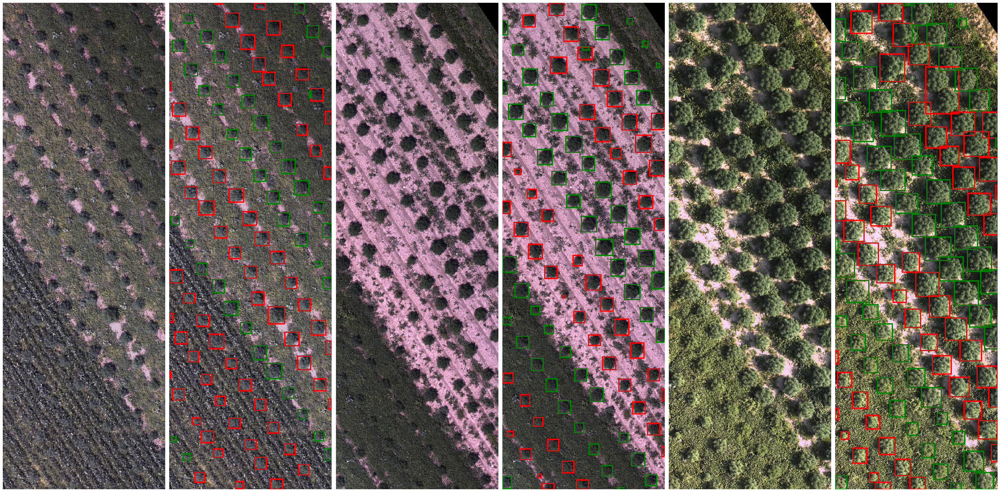

In [19]:
import matplotlib.patches as mpatches
from skimage.measure import label, regionprops, regionprops_table

fig, axs = plt.subplots(1, 6, figsize=(35, 35))

for i, ax in enumerate(axs):
    ax.imshow(images[i])
    ax.set_axis_off()
    if i % 2 == 0:
        continue
    for species in [0, 1]:
            label_image = label(preds[i][:, :, species])
            for region in regionprops(label_image):
                if region.area >= 100:
                    minr, minc, maxr, maxc = region.bbox
                    if species == 0:
                        color = 'red'
                    elif species == 1:
                        color = 'green'
                    rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                              fill=False, edgecolor=color, linewidth=3)
                    ax.add_patch(rect)

plt.tight_layout()

In [23]:
images = [image0703[6000:7000, 5000:6000],
          image0703[6000:7000, 5000:6000], image0719[6000:7000, 5000:6000], image0719[6000:7000, 5000:6000]]
preds = [pred0703[6000:7000, 5000:6000],
         pred0703[6000:7000, 5000:6000], pred0719[6000:7000, 5000:6000], pred0719[6000:7000, 5000:6000]]

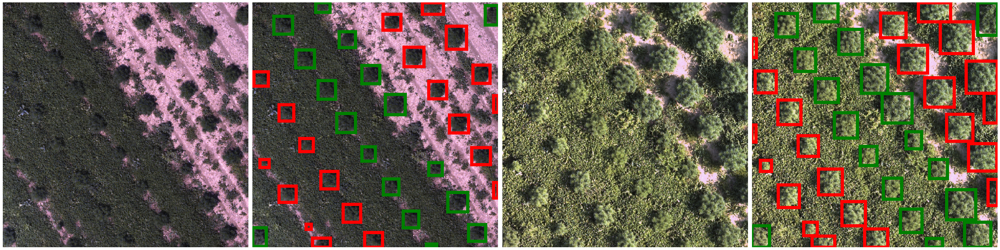

In [27]:
import matplotlib.patches as mpatches
from skimage.measure import label, regionprops, regionprops_table

fig, axs = plt.subplots(1, 4, figsize=(35, 35))

for i, ax in enumerate(axs):
    ax.imshow(images[i])
    ax.set_axis_off()
    if i % 2 == 0:
        continue
    for species in [0, 1]:
            label_image = label(preds[i][:, :, species])
            for region in regionprops(label_image):
                if region.area >= 100:
                    minr, minc, maxr, maxc = region.bbox
                    if species == 0:
                        color = 'red'
                    elif species == 1:
                        color = 'green'
                    rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                              fill=False, edgecolor=color, linewidth=8)
                    ax.add_patch(rect)

plt.tight_layout()

# Volume Calculation

In [24]:
new_Seed_Masks = {}
new_Seed_Masks['s_1_2'] = gpd.overlay(Seed_Masks['s_1'], Seed_Masks['s_2'], how='union')
new_Seed_Masks['s_3_4'] = gpd.overlay(Seed_Masks['s_3'], Seed_Masks['s_4'], how='union')
new_Seed_Masks['s_5_6'] = gpd.overlay(Seed_Masks['s_5'], Seed_Masks['s_6'], how='union')
new_Seed_Masks['s_7_8'] = gpd.overlay(Seed_Masks['s_7'], Seed_Masks['s_8'], how='union')
new_Seed_Masks['s_9_10'] = gpd.overlay(Seed_Masks['s_9'], Seed_Masks['s_10'], how='union')
new_Seed_Masks['s_11_12'] = gpd.overlay(Seed_Masks['s_11'], Seed_Masks['s_12'], how='union')
new_Seed_Masks['s_13_14'] = gpd.overlay(Seed_Masks['s_13'], Seed_Masks['s_14'], how='union')

In [30]:
df = pd.DataFrame(columns={'date', 'field', 'seed', 'species', 'hemp_volume_per_100m2', 'area'})

for date in ['20190703', '20190719', '20190822']:
    dsm = rio.open("../data/rasters/{}/dsm.tif".format(date))
    for field_key in ['A', 'B', 'C']:
        for seed_key, seed_value in new_Seed_Masks.items():
            for i, species in enumerate(['1001', '1005']):
                hemp_volume, area = calc_volume(rio.open("../data/exports/prediction_{}_rgb_{}_mv_True_overlap_64.tif".format(date, field_key)), 
                                                dsm, 
                                                Fields["field_{}".format(field_key)], 
                                                seed_value, 
                                                i)
                
                df = df.append({'date': date[4:],
                                'field': field_key,
                                'seed': seed_key,
                                'species': species,
                                'hemp_volume_per_100m2': hemp_volume,
                                'area': area},
                                ignore_index=True)

Text(0.5, 1, 'Species 1005, Field C')

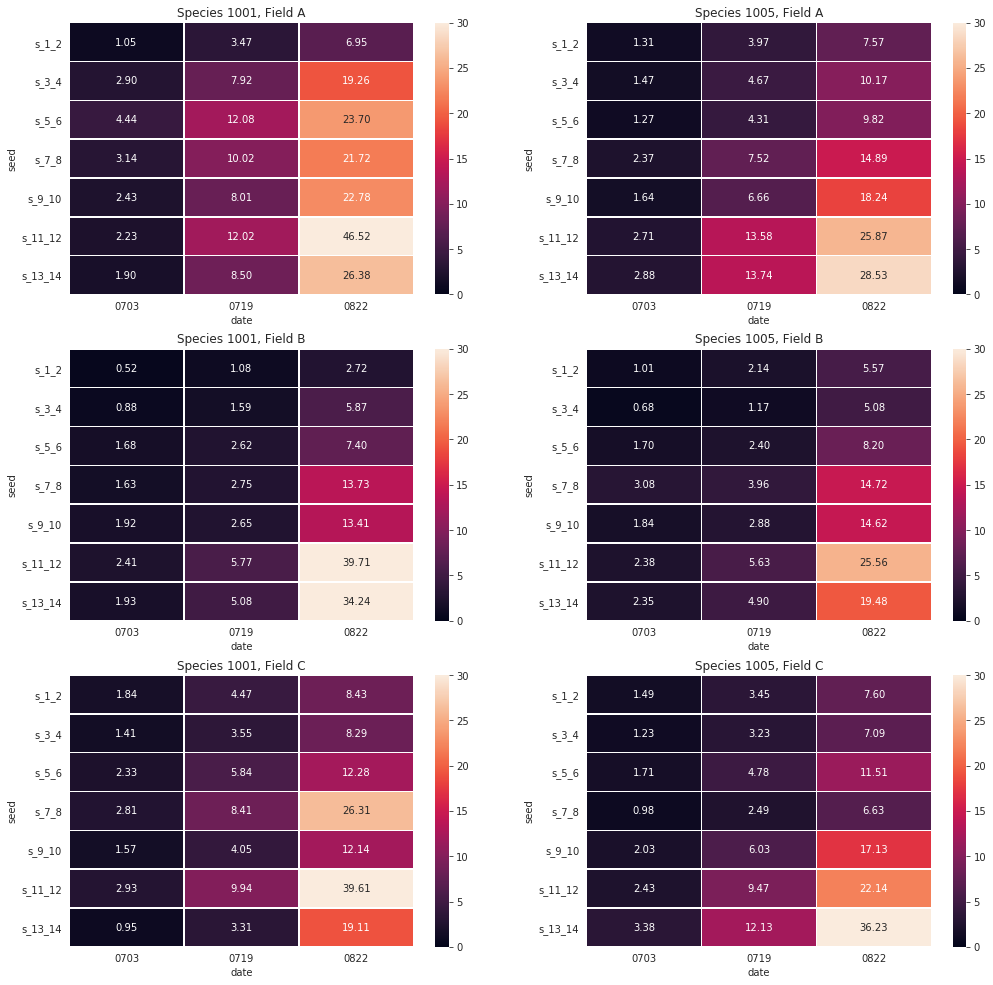

In [31]:
# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(3, 2, figsize=(17, 17))

tmp = df.loc[(df['species'] == '1001') & (df['field'] == 'A')]
tmp = tmp.pivot('seed', 'date', 'hemp_volume_per_100m2')
tmp = tmp.reindex(["s_1_2", "s_3_4", "s_5_6", "s_7_8", "s_9_10", "s_11_12", "s_13_14"])
sns.heatmap(tmp, annot=True, fmt=".2f", linewidths=.5, ax=ax[0, 0], vmin=0, vmax=30)
ax[0, 0].set_title("Species 1001, Field A")

tmp = df.loc[(df['species'] == '1005') & (df['field'] == 'A')]
tmp = tmp.pivot('seed', 'date', 'hemp_volume_per_100m2')
tmp = tmp.reindex(["s_1_2", "s_3_4", "s_5_6", "s_7_8", "s_9_10", "s_11_12", "s_13_14"])
sns.heatmap(tmp, annot=True, fmt=".2f", linewidths=.5, ax=ax[0, 1], vmin=0, vmax=30)
ax[0, 1].set_title("Species 1005, Field A")

tmp = df.loc[(df['species'] == '1001') & (df['field'] == 'B')]
tmp = tmp.pivot('seed', 'date', 'hemp_volume_per_100m2')
tmp = tmp.reindex(["s_1_2", "s_3_4", "s_5_6", "s_7_8", "s_9_10", "s_11_12", "s_13_14"])
sns.heatmap(tmp, annot=True, fmt=".2f", linewidths=.5, ax=ax[1, 0], vmin=0, vmax=30)
ax[1, 0].set_title("Species 1001, Field B")

tmp = df.loc[(df['species'] == '1005') & (df['field'] == 'B')]
tmp = tmp.pivot('seed', 'date', 'hemp_volume_per_100m2')
tmp = tmp.reindex(["s_1_2", "s_3_4", "s_5_6", "s_7_8", "s_9_10", "s_11_12", "s_13_14"])
sns.heatmap(tmp, annot=True, fmt=".2f", linewidths=.5, ax=ax[1, 1], vmin=0, vmax=30)
ax[1, 1].set_title("Species 1005, Field B")

tmp = df.loc[(df['species'] == '1001') & (df['field'] == 'C')]
tmp = tmp.pivot('seed', 'date', 'hemp_volume_per_100m2')
tmp = tmp.reindex(["s_1_2", "s_3_4", "s_5_6", "s_7_8", "s_9_10", "s_11_12", "s_13_14"])
sns.heatmap(tmp, annot=True, fmt=".2f", linewidths=.5, ax=ax[2, 0], vmin=0, vmax=30)
ax[2, 0].set_title("Species 1001, Field C")

tmp = df.loc[(df['species'] == '1005') & (df['field'] == 'C')]
tmp = tmp.pivot('seed', 'date', 'hemp_volume_per_100m2')
tmp = tmp.reindex(["s_1_2", "s_3_4", "s_5_6", "s_7_8", "s_9_10", "s_11_12", "s_13_14"])
sns.heatmap(tmp, annot=True, fmt=".2f", linewidths=.5, ax=ax[2, 1], vmin=0, vmax=30)
ax[2, 1].set_title("Species 1005, Field C")

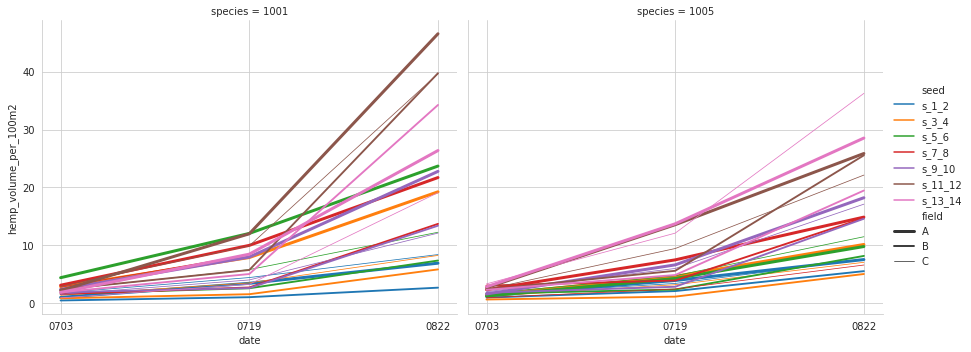

In [32]:
# Plot the lines on two facets
sns.relplot(x="date", y="hemp_volume_per_100m2",
            hue="seed", size="field", col="species",
            height=5, aspect=1.25, facet_kws=dict(sharex=False),
            kind="line", legend="full", data=df)